<a href="https://colab.research.google.com/github/miramnair/Visualizing-FeatureMaps/blob/main/CNN_basics.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

Check current working directory

---



In [ ]:
!pwd

/content


Import Libraries

---



In [ ]:
import cv2
import numpy

In [ ]:
import cv2 # Import OpenCV
img = cv2.imread('house.jpeg')   #read the image


In [ ]:
cv2_imshow(img)  #### display the image

NameError: ignored

In [ ]:
from google.colab.patches import cv2_imshow

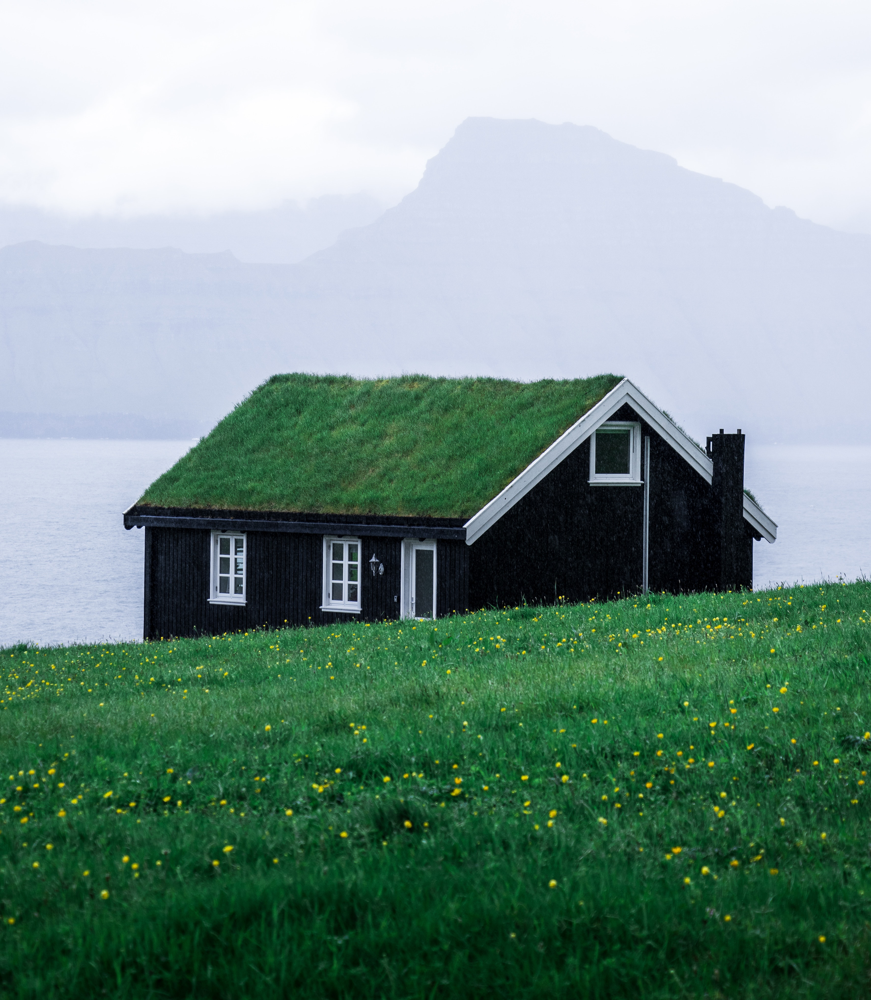

In [ ]:
cv2_imshow(img)

In [ ]:
# Get the size  of the image
height, width, channels = img.shape

# Print the size
print(f"Height: {height}, Width: {width},  Channels: {channels}")

Height: 4068, Width: 3546,  Channels: 3


In [ ]:
img = cv2.resize(img, (224,224)) #resize the image

# Get the shape of the image
height, width, channels = img.shape

# Print the shape
print(f"Height: {height}, Width: {width},  Channels: {channels}")

Height: 224, Width: 224,  Channels: 3


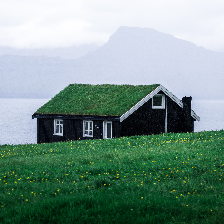

In [ ]:
cv2_imshow(img)

In [ ]:
import keras
from keras.models import Sequential
from keras.layers import Conv2D, MaxPooling2D

In [ ]:
# Create a Sequential model
model = Sequential()

# Add a Conv2D layer with 12 filters, a 3x3 kernel
model.add(Conv2D(12, kernel_size=(3, 3), input_shape=(224,224,3)))

model.summary()

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_1 (Conv2D)           (None, 222, 222, 12)      336       
                                                                 
Total params: 336 (1.31 KB)
Trainable params: 336 (1.31 KB)
Non-trainable params: 0 (0.00 Byte)
_________________________________________________________________


In [ ]:
# Create a Sequential model
model = Sequential()

# Add a Conv2D layer with 12 filters, a 3x3 kernel
model.add(Conv2D(12, kernel_size=(3, 3), input_shape=(224,224,3),padding = 'same'))

model.summary()

Model: "sequential_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_2 (Conv2D)           (None, 224, 224, 12)      336       
                                                                 
Total params: 336 (1.31 KB)
Trainable params: 336 (1.31 KB)
Non-trainable params: 0 (0.00 Byte)
_________________________________________________________________


In [ ]:
import numpy as np

feature_map = model.predict(np.array([img]))

1/1 [==============================] - 0s 71ms/step


In [ ]:
print(feature_map.shape)

(1, 224, 224, 12)


In [ ]:
print(feature_map[0, :, :, 0])

[[-5.45197296e+01 -5.42249870e+01 -5.42433243e+01 -5.48106079e+01
  -5.43793945e+01 -5.49329224e+01 -5.49156723e+01 -5.48570557e+01
  -5.48800049e+01 -5.47406616e+01 -5.42092819e+01 -5.46912918e+01
  -5.46222572e+01 -5.39929390e+01 -5.37037086e+01 -5.40443878e+01
  -5.38984108e+01 -5.38663139e+01 -5.41006279e+01 -5.39695396e+01
  -5.40411873e+01 -5.41145363e+01 -5.38561287e+01 -5.40788231e+01
  -5.38906326e+01 -5.36916618e+01 -5.38271446e+01 -5.35562248e+01
  -5.32600212e+01 -5.33737755e+01]
 [-5.37400551e+01 -5.40876923e+01 -5.34648323e+01 -5.44282188e+01
  -5.46028786e+01 -5.51559525e+01 -5.43974457e+01 -5.44232140e+01
  -5.43438148e+01 -5.47455177e+01 -5.42455940e+01 -5.43765793e+01
  -5.50691872e+01 -5.40090141e+01 -5.37603416e+01 -5.39493103e+01
  -5.39875908e+01 -5.36867561e+01 -5.39069557e+01 -5.35646782e+01
  -5.36843071e+01 -5.37357826e+01 -5.36722984e+01 -5.34776840e+01
  -5.37230034e+01 -5.30944862e+01 -5.34085159e+01 -5.31239052e+01
  -5.28185349e+01 -5.34102173e+01]
 [-5.2

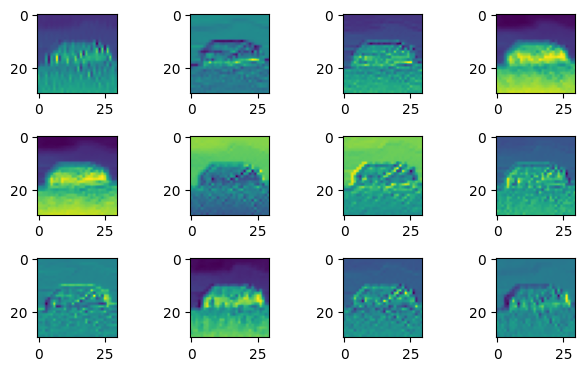

In [ ]:
import matplotlib.pyplot as plt

for i in range(12):
  feature_image = feature_map[0, :, :, i]
  ax = plt.subplot(4,4,i+1)
  plt.imshow(feature_image)
plt.tight_layout()
plt.show()


In [ ]:

# Create a Sequential model
model = Sequential()

# Add a Conv2D layer with 12 filters, a 3x3 kernel, and 'relu' activation
model.add(Conv2D(12, kernel_size=(3, 3), input_shape=(224,224,3),activation='relu'))
model.add(MaxPooling2D(pool_size=(2, 2)))

In [ ]:
feature_map = model.predict(np.array([img]))

1/1 [==============================] - 0s 47ms/step


In [ ]:
print(feature_map.shape)

(1, 111, 111, 12)


In [ ]:
print(feature_map)

[[[[  0.        126.39392     0.        ... 201.15761   104.724205
     69.44166  ]
   [  0.        126.29117     0.        ... 201.66515   104.33317
     69.377174 ]
   [  0.        126.05896     0.        ... 201.55785   104.40621
     69.4305   ]
   ...
   [  0.        125.50457     0.        ... 199.79051   102.381355
     68.673    ]
   [  0.        125.79711     0.        ... 200.14046   102.46031
     68.81784  ]
   [  0.        126.19349     0.        ... 200.04703   102.18884
     68.81651  ]]

  [[  0.        125.974884    0.        ... 201.41193   104.87596
     69.16451  ]
   [  0.        126.114746    0.        ... 201.56769   104.80049
     69.25591  ]
   [  0.        126.09857     0.        ... 201.521     104.670395
     69.05576  ]
   ...
   [  0.        125.7795      0.        ... 200.02513   101.78706
     68.740524 ]
   [  0.        125.776375    0.        ... 199.79149   101.92851
     68.865875 ]
   [  0.        125.87505     0.        ... 199.68214   101.59302
  

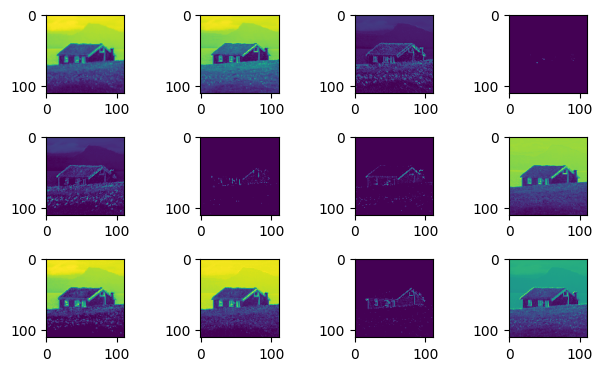

In [ ]:
for i in range(12):
  feature_image = feature_map[0, :, :, i]
  ax = plt.subplot(4,4,i+1)
  plt.imshow(feature_image)
plt.tight_layout()
plt.show()
